# MMS Auralization with spaudiopy

In [1]:
import numpy as np
import spaudiopy as spa
import IPython

import pandas as pd
import urllib.request # for pulling audifications and plots directly from CDAWeb
import wget # for downloading audifications

In [2]:
# sampling frequency
fs = 44100
# define a mono input signal:
sig_in = pd.read_csv('output/THG_L2_MAG_PG0__000_000_Output_mono.csv')['M'].to_numpy()
IPython.display.Audio(sig_in, rate = fs)          # play audio in Jupyter notebook

## Load loudspeaker layout, specific to instrumentation:

/mnt/c/Users/kvc2/Documents/Space Science Institute/spaudiopy/spaudiopy/utils.py:52: RuntimeWarning: invalid value encountered in divide
  zen = np.arccos(z / r) if not steady_zen else \


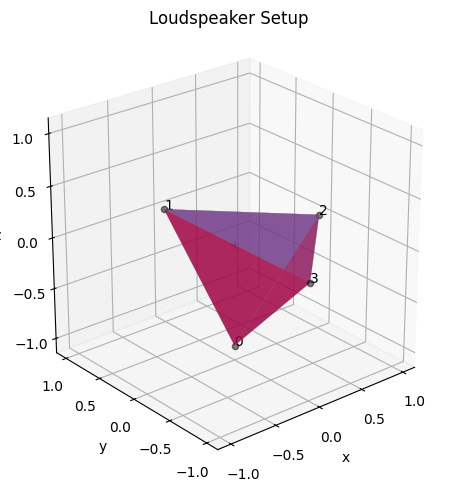

In [3]:
# load a loudspeaker layout
# ls_layout = spa.io.load_layout('ls_layouts/Aalto_subset_C.json')
ls_layout = spa.io.load_layout('ls_layouts/MMS.json')
ls_layout.show()

## Pull data from CDAWeb 

We pulled the data for this experiment manually, and it can be found in the `\data` subdirectory. In future iterations, this will be replaced by `ai.cdas` or another python package for pulling data automatically: https://aicdas.readthedocs.io/getting_started.html#examples

## Set up signals array 
4 channels x number of samples.

Our data: 

Start: `2016/12/09 09:00:00.000`
Stop: `2016/12/09 09:05:00.000`
We used MMS Level 2 Search Coil Magnetometer AC Magnetic Field Burst (8192S/s) Data between 2016/12/09 09:00:38.000 09:00:46.000, specifically the Bz field.

https://svs.gsfc.nasa.gov/4639

In [4]:
# define auralization (front)
src_coords = [1, 10, -50]
# define decoding, using vbap as simple example
ls_gains = spa.decoder.vbap(src_coords, ls_layout)
ls_sigs = ls_layout.loudspeaker_signals(ls_gains, sig_in)

In [5]:
ls_sigs.shape

(4, 604800)

In [6]:
type(ls_sigs)

numpy.ndarray

### Code used to convert audified files to numpy arrays
`spaudiopy` doesn't accept .wav files as input - just numpy arrays - so we downloaded the audified .wav files manually from CDAWeb, then converted them to numpy arrays with the following code. In future, of course, we plan to (a) pull the data automatically from CDAWeb and (b) generate appropriately scaled numpy arrays from the data. For now, this is just a proof of concept. 

Now we load in the converted signals.

In [7]:
df = pd.read_csv('data/MMS1_SCM_BRST_L2_SCB_4142755_000_002_Output_mono.csv')
sig1 = df['M'].to_numpy()
df = pd.read_csv('data/MMS2_SCM_BRST_L2_SCB_4142755_001_002_Output_mono.csv')
sig2 = df['M'].to_numpy()
df = pd.read_csv('data/MMS3_SCM_BRST_L2_SCB_4142755_002_002_Output_mono.csv')
sig3 = df['M'].to_numpy()
df = pd.read_csv('data/MMS4_SCM_BRST_L2_SCB_4142755_003_002_Output_mono.csv')
sig4 = df['M'].to_numpy()

We check to see if the signals are the same length. They are slightly different, so we'll cut a few samples off to match them all to the shortest (sig1). This isn't good practice in the long-term, but we can get away with it here since it's such a small fraction of the signal.

In [8]:
print(sig1.shape)
print(sig2.shape)
print(sig3.shape)
print(sig4.shape)

(2457564,)
(2457570,)
(2457566,)
(2457566,)


In [9]:
sig2 = sig2[:len(sig1)]
sig3 = sig3[:len(sig1)]
sig4 = sig4[:len(sig1)]

Now we stack the vectors into a single numpy array that we can use with `spaudiopy`:

In [10]:
ls_sigs = np.stack((sig1, sig2, sig3, sig4), axis=0)
ls_sigs.shape

(4, 2457564)

## Binauralize

In [11]:
# # define auralization (front)
# src_coords = [1, 10, -50]
# # define decoding, using vbap as simple example
# ls_gains = spa.decoder.vbap(src_coords, ls_layout)
# ls_sigs = ls_layout.loudspeaker_signals(ls_gains, sig_in)
import soundfile

# binaural simulation of this setup
s_left, s_right = ls_layout.binauralize(ls_sigs, fs)

# for convenience we could now make a signal object and listen to it
# spa.sig.MultiSignal([s_left, s_right], fs=fs).play()
audio = np.array([s_left, s_right]).T

# TODO: Save wav file with fs = 22000 
soundfile.write("output/MMS_Bz.wav", audio, 22000) 

IPython.display.Audio([s_left, s_right],rate=22000)
